In [25]:
import os
import gzip
import gc
import re

from io import StringIO
from google.cloud import storage
from dotenv import load_dotenv

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

import torch
import torch.nn.functional as F

from transformers import AutoModelForCausalLM
from transformers import AutoTokenizer, EsmForMaskedLM
from tokenizers import Tokenizer
from peft import get_peft_model, LoraConfig, TaskType

In [26]:
from plm_compare_progen2 import *
from plm_compare_esm import *
from protein_data import *
from pro_gen2_lora import *

In [27]:
def sort_key(s):
    eps = int(re.search(r'eps(\d+)', s).group(1))
    domain = re.search(r'(PF\d+_\d+)', s).group(1)
    return (domain, eps)



In [28]:
load_dotenv()
cred_path = os.getenv('GOOGLE_APPLICATION_CREDENTIALS')

os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = cred_path

client = storage.Client()
bucket = client.bucket('domainome-data')

blobs = bucket.list_blobs(prefix="lora_dicts_hp_check/")
blobs_names = [blob.name for blob in blobs]
blobs_names = [b.split("_lora")[0] for b in blobs_names]
blobs_names = blobs_names
blobs_names = ['model-'+b.split("/")[1] for b in blobs_names]

In [29]:
# blobs_names = [b for b in blobs_names if 'lr1en5' in b]
blobs_names

['model-A0PJY2_PF00096_289',
 'model-A1X283_PF00018_155',
 'model-A1X283_PF00018_222',
 'model-A6NK59_PF07525_532',
 'model-O00308_PF00397_440',
 'model-O00330_PF02817_181',
 'model-O14529_PF02376_895',
 'model-O14640_PF00595_246',
 'model-O14640_PF00778_4',
 'model-O14776_PF01846_645',
 'model-O14776_PF01846_727',
 'model-O14776_PF01846_793',
 'model-O14776_PF01846_897',
 'model-O14776_PF01846_955',
 'model-O14813_PF00046_92',
 'model-O14901_PF00096_395',
 'model-O14936_PF00595_488',
 'model-O15151_PF00641_299',
 'model-O15259_PF00018_152',
 'model-O15265_PF08313_334',
 'model-O15266_PF00046_119',
 'model-O15344_PF00643_172',
 'model-O15350_PF07647_487',
 'model-O15405_PF00505_256',
 'model-O15541_PF00642_198',
 'model-O43167_PF00096_351',
 'model-O43167_PF00096_435',
 'model-O43186_PF00046_41',
 'model-O43295_PF00018_745',
 'model-O43353_PF00619_438',
 'model-O43374_PF00779_682',
 'model-O43395_PF01480_10']

In [30]:
dict_hm = {k : {} for k in blobs_names}

In [31]:
dict_hm

{'model-A0PJY2_PF00096_289': {},
 'model-A1X283_PF00018_155': {},
 'model-A1X283_PF00018_222': {},
 'model-A6NK59_PF07525_532': {},
 'model-O00308_PF00397_440': {},
 'model-O00330_PF02817_181': {},
 'model-O14529_PF02376_895': {},
 'model-O14640_PF00595_246': {},
 'model-O14640_PF00778_4': {},
 'model-O14776_PF01846_645': {},
 'model-O14776_PF01846_727': {},
 'model-O14776_PF01846_793': {},
 'model-O14776_PF01846_897': {},
 'model-O14776_PF01846_955': {},
 'model-O14813_PF00046_92': {},
 'model-O14901_PF00096_395': {},
 'model-O14936_PF00595_488': {},
 'model-O15151_PF00641_299': {},
 'model-O15259_PF00018_152': {},
 'model-O15265_PF08313_334': {},
 'model-O15266_PF00046_119': {},
 'model-O15344_PF00643_172': {},
 'model-O15350_PF07647_487': {},
 'model-O15405_PF00505_256': {},
 'model-O15541_PF00642_198': {},
 'model-O43167_PF00096_351': {},
 'model-O43167_PF00096_435': {},
 'model-O43186_PF00046_41': {},
 'model-O43295_PF00018_745': {},
 'model-O43353_PF00619_438': {},
 'model-O43374

In [32]:
load_dotenv()
cred_path = os.getenv('GOOGLE_APPLICATION_CREDENTIALS')

os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = cred_path

client = storage.Client()
bucket = client.bucket('domainome-data')
blob = bucket.blob("base_LLRs.pkl.gz")

with gzip.open(blob.open("rb"), "rb") as f:
        dict_base = pickle.load(f)



In [33]:
filename = '/Users/johnhutchens/Desktop/Practicum/Data/Domainome/dict_dn_fitness.pkl'
with open(filename, "rb") as f:
    dict_dn_fitness = pickle.load(f)

In [11]:
dict_dn_fitness

{'A0A2R8Y422_PF00240_2': {'dom_seq': 'QIFVKTLMGKTITLEVELSDTIDNVKAKIQDKEGIPPDQQRLIFAGKQLEDGRTLSDYNIQKESTLHLVL',
  'uniprot_id': 'A0A2R8Y422',
  'pfam': 'PF00240',
  'domain_start': '2',
  'fitness': [-0.280789669693156,
   -0.103250266182212,
   -0.258003463940259,
   0.376782636488238,
   0.149046632098227,
   -0.187511607393213,
   -0.111728040072573,
   0.28014749897967,
   0.179340002571484,
   0.133359739131628,
   -0.170486170149888,
   0.213562029209033,
   -0.728559271446471,
   nan,
   -0.06181253769339,
   -0.040570763010855,
   0.160116898879892,
   0.0749988165010841,
   -0.203489963228899,
   0.267453947886271,
   -0.658535772340188,
   -0.458064361612281,
   -0.955485314389134,
   -1.48141990737615,
   -0.252340176524816,
   -1.0048814778358,
   -1.00963634229646,
   nan,
   -1.38335060728201,
   -0.0586843189615014,
   0.0091776489296827,
   -1.18316759213014,
   -0.869488221454636,
   -1.1257808641811,
   -1.02035926265076,
   -1.09083221122697,
   -0.626917163199318,
  

In [12]:
dict_base

{'P00519': {'sequence': 'MLEICLKLVGCKSKKGLSSSSSCYLEEALQRPVASDFEPQGLSEAARWNSKENLLAGPSENDPNLFVALYDFVASGDNTLSITKGEKLRVLGYNHNGEWCEAQTKNGQGWVPSNYITPVNSLEKHSWYHGPVSRNAAEYLLSSGINGSFLVRESESSPGQRSISLRYEGRVYHYRINTASDGKLYVSSESRFNTLAELVHHHSTVADGLITTLHYPAPKRNKPTVYGVSPNYDKWEMERTDITMKHKLGGGQYGEVYEGVWKKYSLTVAVKTLKEDTMEVEEFLKEAAVMKEIKHPNLVQLLGVCTREPPFYIITEFMTYGNLLDYLRECNRQEVNAVVLLYMATQISSAMEYLEKKNFIHRDLAARNCLVGENHLVKVADFGLSRLMTGDTYTAHAGAKFPIKWTAPESLAYNKFSIKSDVWAFGVLLWEIATYGMSPYPGIDLSQVYELLEKDYRMERPEGCPEKVYELMRACWQWNPSDRPSFAEIHQAFETMFQESSISDEVEKELGKQGVRGAVSTLLQAPELPTKTRTSRRAAEHRDTTDVPEMPHSKGQGESDPLDHEPAVSPLLPRKERGPPEGGLNEDERLLPKDKKTNLFSALIKKKKKTAPTPPKRSSSFREMDGQPERRGAGEEEGRDISNGALAFTPLDTADPAKSPKPSNGAGVPNGALRESGGSGFRSPHLWKKSSTLTSSRLATGEEEGGGSSSKRFLRSCSASCVPHGAKDTEWRSVTLPRDLQSTGRQFDSSTFGGHKSEKPALPRKRAGENRSDQVTRGTVTPPPRLVKKNEEAADEVFKDIMESSPGSSPPNLTPKPLRRQVTVAPASGLPHKEEAGKGSALGTPAAAEPVTPTSKAGSGAPGGTSKGPAEESRVRRHKHSSESPGRDKGKLSRLKPAPPPPPAASAGKAGGKPSQSPSQEAAGEAVLGAKTKATSLVDAVNSDAAKPSQPGEGLKKPVLPATPKPQSAKPSGTP

# Spearman heatmap lr=1e-4, num_samples = 10, large batch

In [34]:
load_dotenv()
cred_path = os.getenv('GOOGLE_APPLICATION_CREDENTIALS')

os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = cred_path

client = storage.Client()
bucket = client.bucket('domainome-data')

blobs = bucket.list_blobs(prefix="lora_dicts_hp_check")

rows = []

for blob in blobs:
    bname = blob.name
    model_key = "model-"+bname.split("_lora")[0].split("/")[1]
    print(model_key)

    blob = bucket.blob(bname)
    with gzip.open(blob.open("rb"), "rb") as f:
        dict_lora = pickle.load(f)
    for dom_id in dict_dn_fitness.keys():
        uid = dict_dn_fitness[dom_id]['uniprot_id']

        if uid in dict_lora.keys():
            dom_pos = int(dict_dn_fitness[dom_id]['domain_start'])
            dom_seq = dict_dn_fitness[dom_id]['dom_seq']
            dom_len = int(len(dom_seq))

            # check if there is data in dict_lora[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1]
            if dom_pos - 1 + dom_len < 1024:
            
                seq = dict_lora[uid]['sequence']

                # print(dom_seq)
                # print(seq[dom_pos-1:dom_pos+dom_len-1])

                base_arr = dict_base[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1].flatten()
                lora_arr = dict_lora[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1].flatten()
                fitness = np.array(dict_dn_fitness[dom_id]['fitness'])

                # print(dom_id)
                lora_sp, _ = spearman_ignore_nan(lora_arr, fitness)
                base_sp, _ = spearman_ignore_nan(base_arr, fitness)
                diff_sp = lora_sp - base_sp
                # print(diff_sp)

                rows.append({
                    "model": model_key,
                    "domain_id": dom_id,
                    "uniprot_id": uid,
                    "lora_spearman": lora_sp,
                    "base_spearman": base_sp,
                    "diff_spearman": diff_sp
                })

            

model-A0PJY2_PF00096_289
model-A1X283_PF00018_155
model-A1X283_PF00018_222
model-A6NK59_PF07525_532
model-O00308_PF00397_440
model-O00330_PF02817_181
model-O14529_PF02376_895
model-O14640_PF00595_246
model-O14640_PF00778_4
model-O14776_PF01846_645
model-O14776_PF01846_727
model-O14776_PF01846_793
model-O14776_PF01846_897
model-O14776_PF01846_955
model-O14813_PF00046_92
model-O14901_PF00096_395
model-O14936_PF00595_488
model-O15151_PF00641_299
model-O15259_PF00018_152
model-O15265_PF08313_334
model-O15266_PF00046_119
model-O15344_PF00643_172
model-O15350_PF07647_487
model-O15405_PF00505_256
model-O15541_PF00642_198
model-O43167_PF00096_351
model-O43167_PF00096_435
model-O43186_PF00046_41
model-O43295_PF00018_745
model-O43353_PF00619_438
model-O43374_PF00779_682
model-O43395_PF01480_10


In [35]:
df_spearman = pd.DataFrame(rows)
df_spearman.shape

(14848, 6)

In [37]:
df_spearman.head()

,model,domain_id,uniprot_id,lora_spearman,base_spearman,diff_spearman
0,model-A0PJY2_PF00096_289,A0PJY2_PF00096_289,A0PJY2,0.051380,0.064622,-0.013241
1,model-A0PJY2_PF00096_289,A1X283_PF00018_155,A1X283,0.405550,0.407009,-0.001459
2,model-A0PJY2_PF00096_289,A1X283_PF00018_222,A1X283,0.284282,0.286978,-0.002696
3,model-A0PJY2_PF00096_289,A6NK59_PF07525_532,A6NK59,0.023054,0.023704,-0.000650
4,model-A0PJY2_PF00096_289,O00308_PF00397_440,O00308,0.446050,0.442646,0.003405


In [41]:
df_spearman.describe()

,lora_spearman,base_spearman,diff_spearman
count,14848.000000,14848.000000,14848.000000
mean,0.307270,0.307689,-0.000418
std,0.127813,0.127511,0.003058
min,-0.152891,-0.142876,-0.032468
25%,0.226477,0.228224,-0.001692
50%,0.310672,0.310752,-0.000335
75%,0.396537,0.397207,0.001002
max,0.670962,0.668016,0.034762


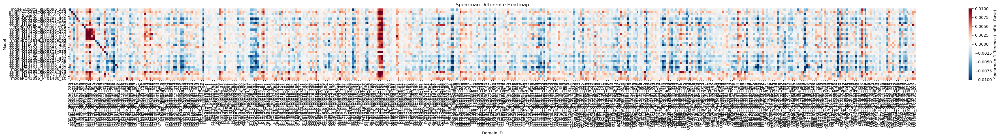

In [40]:
heatmap_df = df_spearman.pivot(
    index="model",
    columns="domain_id",
    values="diff_spearman"
)

plt.figure(figsize=(40, 5))

sns.heatmap(
    heatmap_df,
    cmap="RdBu_r",
    center=0,  
    vmin=-0.01,
    vmax=0.01,
    cbar_kws={"label": "Spearman Difference (LoRA - Base)"},
    xticklabels=True,
    yticklabels=True
)

plt.xticks(rotation=90)
plt.xlabel("Domain ID")
plt.ylabel("Model")
plt.title("Spearman Difference Heatmap")

plt.tight_layout()
plt.show()

# Spearman heatmap lr = 1e-5, num_samples = 10

In [14]:
load_dotenv()
cred_path = os.getenv('GOOGLE_APPLICATION_CREDENTIALS')

os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = cred_path

client = storage.Client()
bucket = client.bucket('domainome-data')

blobs = bucket.list_blobs(prefix="lora_dicts_hp/lr1en5")

rows = []

for blob in blobs:
    bname = blob.name
    model_key = "model-"+bname.split("_lora")[0].split("/")[1]
    print(model_key)

    blob = bucket.blob(bname)
    with gzip.open(blob.open("rb"), "rb") as f:
        dict_lora = pickle.load(f)
    for dom_id in dict_dn_fitness.keys():
        uid = dict_dn_fitness[dom_id]['uniprot_id']

        if uid in dict_lora.keys():
            dom_pos = int(dict_dn_fitness[dom_id]['domain_start'])
            dom_seq = dict_dn_fitness[dom_id]['dom_seq']
            dom_len = int(len(dom_seq))

            # check if there is data in dict_lora[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1]
            if dom_pos - 1 + dom_len < 1024:
            
                seq = dict_lora[uid]['sequence']

                # print(dom_seq)
                # print(seq[dom_pos-1:dom_pos+dom_len-1])

                base_arr = dict_base[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1].flatten()
                lora_arr = dict_lora[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1].flatten()
                fitness = np.array(dict_dn_fitness[dom_id]['fitness'])

                # print(dom_id)
                lora_sp, _ = spearman_ignore_nan(lora_arr, fitness)
                base_sp, _ = spearman_ignore_nan(base_arr, fitness)
                diff_sp = lora_sp - base_sp
                # print(diff_sp)

                rows.append({
                    "model": model_key,
                    "domain_id": dom_id,
                    "uniprot_id": uid,
                    "lora_spearman": lora_sp,
                    "base_spearman": base_sp,
                    "diff_spearman": diff_sp
                })

            

model-lr1en5_eps16_O15266_PF00046_119
model-lr1en5_eps1_O15266_PF00046_119
model-lr1en5_eps2_O15266_PF00046_119
model-lr1en5_eps32_O15266_PF00046_119
model-lr1en5_eps4_O15266_PF00046_119
model-lr1en5_eps8_O15266_PF00046_119


In [15]:
df_spearman = pd.DataFrame(rows)
df_spearman.shape

(2784, 6)

In [16]:
models = list(df_spearman['model'].unique())

In [18]:
sorted_models = sorted(models, key=sort_key)

print(sorted_models)

['model-lr1en5_eps1_O15266_PF00046_119', 'model-lr1en5_eps2_O15266_PF00046_119', 'model-lr1en5_eps4_O15266_PF00046_119', 'model-lr1en5_eps8_O15266_PF00046_119', 'model-lr1en5_eps16_O15266_PF00046_119', 'model-lr1en5_eps32_O15266_PF00046_119']


In [19]:
for m in sorted_models:
    df_sp_model = df_spearman[df_spearman['model']==m]
    total = df_sp_model.shape[0]
    posi = df_sp_model[df_sp_model['diff_spearman'] > 0].shape[0]
    
    print(m)
    print(f"Total number of domains {total}")
    print(f"Number of domains diff_sp > 0 is {posi}")
    print()
    

model-lr1en5_eps1_O15266_PF00046_119
Total number of domains 464
Number of domains diff_sp > 0 is 220

model-lr1en5_eps2_O15266_PF00046_119
Total number of domains 464
Number of domains diff_sp > 0 is 110

model-lr1en5_eps4_O15266_PF00046_119
Total number of domains 464
Number of domains diff_sp > 0 is 250

model-lr1en5_eps8_O15266_PF00046_119
Total number of domains 464
Number of domains diff_sp > 0 is 137

model-lr1en5_eps16_O15266_PF00046_119
Total number of domains 464
Number of domains diff_sp > 0 is 123

model-lr1en5_eps32_O15266_PF00046_119
Total number of domains 464
Number of domains diff_sp > 0 is 150



In [20]:
df_spearman[df_spearman['diff_spearman'] < 0].shape

(1794, 6)

In [21]:
df_same = df_spearman[
    df_spearman.apply(
        lambda row: row['domain_id'] in row['model'],
        axis=1
    )
]

In [22]:
df_same.head()

,model,domain_id,uniprot_id,lora_spearman,base_spearman,diff_spearman
20,model-lr1en5_eps16_O15266_PF00046_119,O15266_PF00046_119,O15266,0.191599,0.195658,-0.004060
484,model-lr1en5_eps1_O15266_PF00046_119,O15266_PF00046_119,O15266,0.195518,0.195658,-0.000140
948,model-lr1en5_eps2_O15266_PF00046_119,O15266_PF00046_119,O15266,0.194873,0.195658,-0.000786
1412,model-lr1en5_eps32_O15266_PF00046_119,O15266_PF00046_119,O15266,0.181610,0.195658,-0.014048
1876,model-lr1en5_eps4_O15266_PF00046_119,O15266_PF00046_119,O15266,0.194427,0.195658,-0.001231


In [23]:
df_same = df_same.sort_values(by = 'model', key = lambda col: col.map(sort_key))

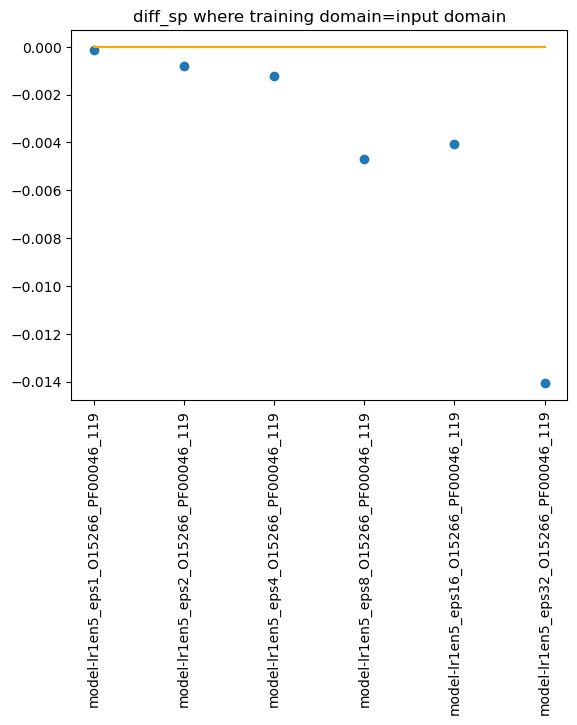

In [24]:
plt.scatter(df_same['model'], df_same['diff_spearman'])
plt.plot(df_same['model'], [0]*df_same.shape[0], color='orange')

plt.title("diff_sp where training domain=input domain")
plt.xticks(rotation=90)
plt.show()

# Spearman heatmap lr = 1e-4, num_samples = 10

In [96]:
load_dotenv()
cred_path = os.getenv('GOOGLE_APPLICATION_CREDENTIALS')

os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = cred_path

client = storage.Client()
bucket = client.bucket('domainome-data')

blobs = bucket.list_blobs(prefix="lora_dicts_hp/lr1en4")

rows = []

for blob in blobs:
    bname = blob.name
    model_key = "model-"+bname.split("_lora")[0].split("/")[1]
    print(model_key)

    blob = bucket.blob(bname)
    with gzip.open(blob.open("rb"), "rb") as f:
        dict_lora = pickle.load(f)
    for dom_id in dict_dn_fitness.keys():
        uid = dict_dn_fitness[dom_id]['uniprot_id']

        if uid in dict_lora.keys():
            dom_pos = int(dict_dn_fitness[dom_id]['domain_start'])
            dom_seq = dict_dn_fitness[dom_id]['dom_seq']
            dom_len = int(len(dom_seq))

            # check if there is data in dict_lora[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1]
            if dom_pos - 1 + dom_len < 1024:
            
                seq = dict_lora[uid]['sequence']

                # print(dom_seq)
                # print(seq[dom_pos-1:dom_pos+dom_len-1])

                base_arr = dict_base[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1].flatten()
                lora_arr = dict_lora[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1].flatten()
                fitness = np.array(dict_dn_fitness[dom_id]['fitness'])

                # print(dom_id)
                lora_sp, _ = spearman_ignore_nan(lora_arr, fitness)
                base_sp, _ = spearman_ignore_nan(base_arr, fitness)
                diff_sp = lora_sp - base_sp
                # print(diff_sp)

                rows.append({
                    "model": model_key,
                    "domain_id": dom_id,
                    "uniprot_id": uid,
                    "lora_spearman": lora_sp,
                    "base_spearman": base_sp,
                    "diff_spearman": diff_sp
                })

            

model-lr1en4_eps16_O14776_PF01846_645
model-lr1en4_eps16_O15266_PF00046_119
model-lr1en4_eps16_Q8NB78_PF07496_139
model-lr1en4_eps1_O14776_PF01846_645
model-lr1en4_eps1_O15266_PF00046_119
model-lr1en4_eps1_Q8NB78_PF07496_139
model-lr1en4_eps2_O14776_PF01846_645
model-lr1en4_eps2_O15266_PF00046_119
model-lr1en4_eps2_Q8NB78_PF07496_139
model-lr1en4_eps32_O14776_PF01846_645
model-lr1en4_eps32_O15266_PF00046_119
model-lr1en4_eps32_Q8NB78_PF07496_139
model-lr1en4_eps4_O14776_PF01846_645
model-lr1en4_eps4_O15266_PF00046_119
model-lr1en4_eps4_Q8NB78_PF07496_139
model-lr1en4_eps8_O14776_PF01846_645
model-lr1en4_eps8_O15266_PF00046_119
model-lr1en4_eps8_Q8NB78_PF07496_139


In [97]:
df_spearman = pd.DataFrame(rows)
df_spearman.shape

(8352, 6)

In [98]:
models = list(df_spearman['model'].unique())

In [99]:
def sort_key(s):
    eps = int(re.search(r'eps(\d+)', s).group(1))
    domain = re.search(r'(PF\d+_\d+)', s).group(1)
    return (domain, eps)

sorted_models = sorted(models, key=sort_key)

print(sorted_models)

['model-lr1en4_eps1_O15266_PF00046_119', 'model-lr1en4_eps2_O15266_PF00046_119', 'model-lr1en4_eps4_O15266_PF00046_119', 'model-lr1en4_eps8_O15266_PF00046_119', 'model-lr1en4_eps16_O15266_PF00046_119', 'model-lr1en4_eps32_O15266_PF00046_119', 'model-lr1en4_eps1_O14776_PF01846_645', 'model-lr1en4_eps2_O14776_PF01846_645', 'model-lr1en4_eps4_O14776_PF01846_645', 'model-lr1en4_eps8_O14776_PF01846_645', 'model-lr1en4_eps16_O14776_PF01846_645', 'model-lr1en4_eps32_O14776_PF01846_645', 'model-lr1en4_eps1_Q8NB78_PF07496_139', 'model-lr1en4_eps2_Q8NB78_PF07496_139', 'model-lr1en4_eps4_Q8NB78_PF07496_139', 'model-lr1en4_eps8_Q8NB78_PF07496_139', 'model-lr1en4_eps16_Q8NB78_PF07496_139', 'model-lr1en4_eps32_Q8NB78_PF07496_139']


In [100]:
for m in sorted_models:
    df_sp_model = df_spearman[df_spearman['model']==m]
    total = df_sp_model.shape[0]
    posi = df_sp_model[df_sp_model['diff_spearman'] > 0].shape[0]
    
    print(m)
    print(f"Total number of domains {total}")
    print(f"Number of domains diff_sp > 0 is {posi}")
    print()
    

model-lr1en4_eps1_O15266_PF00046_119
Total number of domains 464
Number of domains diff_sp > 0 is 41

model-lr1en4_eps2_O15266_PF00046_119
Total number of domains 464
Number of domains diff_sp > 0 is 99

model-lr1en4_eps4_O15266_PF00046_119
Total number of domains 464
Number of domains diff_sp > 0 is 287

model-lr1en4_eps8_O15266_PF00046_119
Total number of domains 464
Number of domains diff_sp > 0 is 152

model-lr1en4_eps16_O15266_PF00046_119
Total number of domains 464
Number of domains diff_sp > 0 is 215

model-lr1en4_eps32_O15266_PF00046_119
Total number of domains 464
Number of domains diff_sp > 0 is 61

model-lr1en4_eps1_O14776_PF01846_645
Total number of domains 464
Number of domains diff_sp > 0 is 92

model-lr1en4_eps2_O14776_PF01846_645
Total number of domains 464
Number of domains diff_sp > 0 is 345

model-lr1en4_eps4_O14776_PF01846_645
Total number of domains 464
Number of domains diff_sp > 0 is 240

model-lr1en4_eps8_O14776_PF01846_645
Total number of domains 464
Number of 

In [101]:
df_spearman[df_spearman['diff_spearman'] < 0].shape

(4790, 6)

In [102]:
df_same = df_spearman[
    df_spearman.apply(
        lambda row: row['domain_id'] in row['model'],
        axis=1
    )
]

In [103]:
df_same.head()

,model,domain_id,uniprot_id,lora_spearman,base_spearman,diff_spearman
9,model-lr1en4_eps16_O14776_PF01846_645,O14776_PF01846_645,O14776,0.206971,0.200567,0.006404
484,model-lr1en4_eps16_O15266_PF00046_119,O15266_PF00046_119,O15266,0.110085,0.195658,-0.085574
1251,model-lr1en4_eps16_Q8NB78_PF07496_139,Q8NB78_PF07496_139,Q8NB78,0.543758,0.563274,-0.019516
1401,model-lr1en4_eps1_O14776_PF01846_645,O14776_PF01846_645,O14776,0.200827,0.200567,0.000260
1876,model-lr1en4_eps1_O15266_PF00046_119,O15266_PF00046_119,O15266,0.187336,0.195658,-0.008323


In [104]:
df_same = df_same.sort_values(by = 'model', key = lambda col: col.map(sort_key))

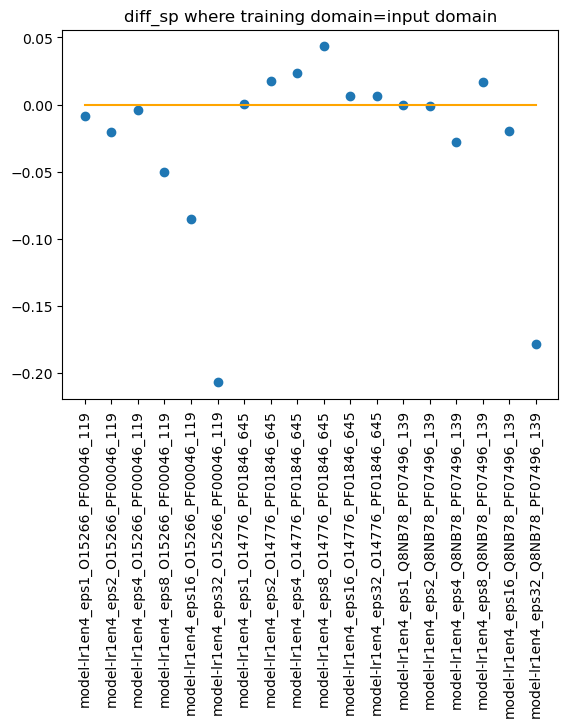

In [105]:
plt.scatter(df_same['model'], df_same['diff_spearman'])
plt.plot(df_same['model'], [0]*df_same.shape[0], color='orange')

plt.title("diff_sp where training domain=input domain")
plt.xticks(rotation=90)
plt.show()

# Spearman heatmap lr = 1e-3, num_samples = 10

In [11]:
load_dotenv()
cred_path = os.getenv('GOOGLE_APPLICATION_CREDENTIALS')

os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = cred_path

client = storage.Client()
bucket = client.bucket('domainome-data')

blobs = bucket.list_blobs(prefix="lora_dicts_hp/")

rows = []

for blob in blobs:
    bname = blob.name
    model_key = "model-"+bname.split("_lora")[0].split("/")[1]
    print(model_key)

    blob = bucket.blob(bname)
    with gzip.open(blob.open("rb"), "rb") as f:
        dict_lora = pickle.load(f)
    for dom_id in dict_dn_fitness.keys():
        uid = dict_dn_fitness[dom_id]['uniprot_id']

        if uid in dict_lora.keys():
            dom_pos = int(dict_dn_fitness[dom_id]['domain_start'])
            dom_seq = dict_dn_fitness[dom_id]['dom_seq']
            dom_len = int(len(dom_seq))

            # check if there is data in dict_lora[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1]
            if dom_pos - 1 + dom_len < 1024:
            
                seq = dict_lora[uid]['sequence']

                # print(dom_seq)
                # print(seq[dom_pos-1:dom_pos+dom_len-1])

                base_arr = dict_base[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1].flatten()
                lora_arr = dict_lora[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1].flatten()
                fitness = np.array(dict_dn_fitness[dom_id]['fitness'])

                # print(dom_id)
                lora_sp, _ = spearman_ignore_nan(lora_arr, fitness)
                base_sp, _ = spearman_ignore_nan(base_arr, fitness)
                diff_sp = lora_sp - base_sp
                # print(diff_sp)

                rows.append({
                    "model": model_key,
                    "domain_id": dom_id,
                    "uniprot_id": uid,
                    "lora_spearman": lora_sp,
                    "base_spearman": base_sp,
                    "diff_spearman": diff_sp
                })

            

model-eps16_O14776_PF01846_645
model-eps16_O14776_PF01846_727
model-eps1_O14776_PF01846_645
model-eps1_O14776_PF01846_727
model-eps2_O14776_PF01846_645
model-eps2_O14776_PF01846_727
model-eps32_O14776_PF01846_645
model-eps4_O14776_PF01846_645
model-eps4_O14776_PF01846_727
model-eps8_O14776_PF01846_645
model-eps8_O14776_PF01846_727


In [12]:
df_spearman = pd.DataFrame(rows)

In [13]:
df_spearman.shape

(5104, 6)

In [14]:
df_same = df_spearman[
    df_spearman.apply(
        lambda row: row['domain_id'] in row['model'],
        axis=1
    )
]

In [15]:
df_same

,model,domain_id,uniprot_id,lora_spearman,base_spearman,diff_spearman
9,model-eps16_O14776_PF01846_645,O14776_PF01846_645,O14776,0.038739,0.200567,-0.161829
474,model-eps16_O14776_PF01846_727,O14776_PF01846_727,O14776,0.261381,0.401473,-0.140092
937,model-eps1_O14776_PF01846_645,O14776_PF01846_645,O14776,0.247886,0.200567,0.047319
1402,model-eps1_O14776_PF01846_727,O14776_PF01846_727,O14776,0.417792,0.401473,0.016319
1865,model-eps2_O14776_PF01846_645,O14776_PF01846_645,O14776,0.175544,0.200567,-0.025023
2330,model-eps2_O14776_PF01846_727,O14776_PF01846_727,O14776,0.380374,0.401473,-0.021099
2793,model-eps32_O14776_PF01846_645,O14776_PF01846_645,O14776,0.091329,0.200567,-0.109238
3257,model-eps4_O14776_PF01846_645,O14776_PF01846_645,O14776,0.137262,0.200567,-0.063305
3722,model-eps4_O14776_PF01846_727,O14776_PF01846_727,O14776,0.294059,0.401473,-0.107414
4185,model-eps8_O14776_PF01846_645,O14776_PF01846_645,O14776,0.018689,0.200567,-0.181878


In [16]:
[0]*df_same.shape[0]

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

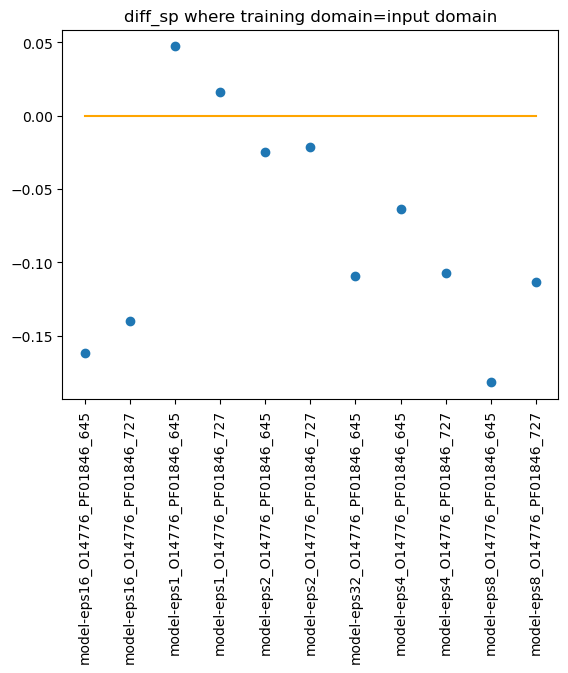

In [17]:

plt.scatter(df_same['model'], df_same['diff_spearman'])
plt.plot(df_same['model'], [0]*df_same.shape[0], color='orange')

plt.title("diff_sp where training domain=input domain")
plt.xticks(rotation=90)
plt.show()

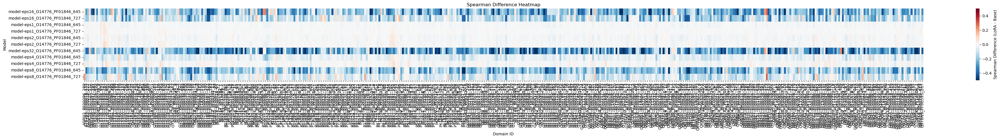

In [18]:
heatmap_df = df_spearman.pivot(
    index="model",
    columns="domain_id",
    values="diff_spearman"
)

plt.figure(figsize=(40, 5))

sns.heatmap(
    heatmap_df,
    cmap="RdBu_r",
    center=0,  
    vmin=-0.5,
    vmax=0.5,
    cbar_kws={"label": "Spearman Difference (LoRA - Base)"},
    xticklabels=True,
    yticklabels=True
)

plt.xticks(rotation=90)
plt.xlabel("Domain ID")
plt.ylabel("Model")
plt.title("Spearman Difference Heatmap")

plt.tight_layout()
plt.show()